In [1]:
# Following https://www.kaggle.com/code/awsaf49/sartorius-coco-data#COCO-Dataset-Generator

In [2]:
!pip install -Uqqq pycocotools

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import GroupKFold
from pathlib import Path
from pycocotools.coco import COCO
from PIL import Image

# Params

In [4]:
FOLD = 0
dataDir=Path('/kaggle/input/global-wheat-detection/train')

In [5]:
df = pd.read_csv('/kaggle/input/global-wheat-detection/train.csv')
print(type(df['bbox'][0]))
df['bbox'] = df['bbox'].apply(lambda x : list(map(int,eval(x))))
print(type(df['bbox'][0]))
df.head()

<class 'str'>
<class 'list'>


,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834, 222, 56, 36]",usask_1
1,b6ab77fd7,1024,1024,"[226, 548, 130, 58]",usask_1
2,b6ab77fd7,1024,1024,"[377, 504, 74, 160]",usask_1
3,b6ab77fd7,1024,1024,"[834, 95, 109, 107]",usask_1
4,b6ab77fd7,1024,1024,"[26, 144, 124, 117]",usask_1


# DataSet Splitting

In [6]:
df = df.reset_index(drop=True)
df['fold'] = -1
skf = GroupKFold(n_splits=5)
for fold, (_, val_idx) in enumerate(skf.split(X=df, y=df['source'], groups=df['image_id'])):
    df.loc[val_idx, 'fold'] = fold

# Helpers

In [7]:
def bbox2mask(bbox, img_w, img_h):
    msk_img = np.zeros(img_w * img_h, dtype = np.uint8)
    msk_img = msk_img.reshape((img_h, img_w))
    msk_img[bbox[1]:bbox[1]+bbox[3],bbox[0]:bbox[0]+bbox[2]] = 1
    msk_img = np.asfortranarray(msk_img) ## This is important so pycocotools can handle this object
    
    return msk_img

# Minor Sanity Check

[834, 222, 56, 36]


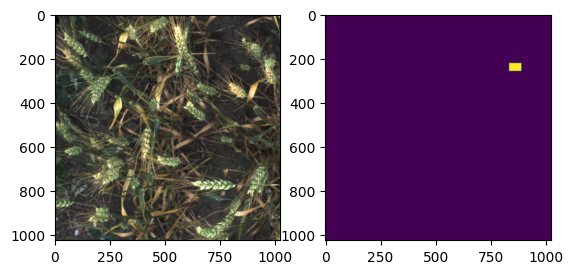

In [8]:
bbox = df.loc[0, 'bbox']
print(bbox)
plt.subplot(1, 2, 1)
plt.imshow(mpimg.imread("/kaggle/input/global-wheat-detection/train/" + df.loc[0, "image_id"] + ".jpg"))
plt.subplot(1,2,2)
plt.imshow(bbox2mask(bbox, 1024, 1024));

# COCO Dataset

In [9]:
from tqdm.notebook import tqdm
from pycocotools import mask as maskUtils
from joblib import Parallel, delayed
import json,itertools

def annotate(idx, row, cat_ids):
        mask = bbox2mask(row['bbox'], row['width'], row['height']) # Binary mask
        c_rle = maskUtils.encode(mask) # Encoding it back to rle (coco format)
        c_rle['counts'] = c_rle['counts'].decode('utf-8') # converting from binary to utf-8
        area = maskUtils.area(c_rle).item() # calculating the area
        bbox = maskUtils.toBbox(c_rle).astype(int).tolist() # calculating the bboxes
        annotation = {
            'segmentation': c_rle,
            'bbox': bbox,
            'area': area,
            'image_id':row['image_id'], 
            'category_id':1, # cat_ids[row['cell_type']], 
            'iscrowd':0, 
            'id':idx
        }
        return annotation
    
def coco_structure(df, workers = 4):
    
    ## Building the header
    cat_ids = {"wheat_head":1}    
    cats =[{'name':name, 'id':id} for name,id in cat_ids.items()]
    images = [{'id':id, 'width':row.width, 'height':row.height, 'file_name':f'{id}.jpg'}\
              for id,row in df.groupby('image_id').agg('first').iterrows()]
    
    ## Building the annotations
    annotations = Parallel(n_jobs=workers)(delayed(annotate)(idx, row, cat_ids) for idx, row in tqdm(df.iterrows(), total = len(df)))
        
    return {'categories':cats, 'images':images, 'annotations':annotations}

In [10]:
train_df = df.query("fold!=@FOLD")
valid_df = df.query("fold==@FOLD")

In [11]:
train_json = coco_structure(train_df)
valid_json = coco_structure(valid_df)

  0%|          | 0/118234 [00:00<?, ?it/s]

  0%|          | 0/29559 [00:00<?, ?it/s]

In [12]:
display(train_json['annotations'][0])
display(valid_json['annotations'][0])

{'segmentation': {'size': [1024, 1024],
  'counts': 'nVRj0T1ln00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000RiU4'},
 'bbox': [834, 222, 56, 36],
 'area': 2016,
 'image_id': 'b6ab77fd7',
 'category_id': 1,
 'iscrowd': 0,
 'id': 0}

{'segmentation': {'size': [1024, 1024],
  'counts': 'bnPl0^1bn000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000^Qc1'},
 'bbox': [896, 978, 76, 46],
 'area': 3496,
 'image_id': '71fd03d51',
 'category_id': 1,
 'iscrowd': 0,
 'id': 260}

In [13]:
with open('annotations_train.json', 'w', encoding='utf-8') as f:
    json.dump(train_json, f, ensure_ascii=True, indent=4)
with open('annotations_valid.json', 'w', encoding='utf-8') as f:
    json.dump(valid_json, f, ensure_ascii=True, indent=4)

# COCO Image

In [14]:
!mkdir -p train2020
!mkdir -p valid2020

In [15]:
import shutil
def run_copy(row):
    img_path = dataDir/f'{row.image_id}.jpg'
    if row.fold!=FOLD:
        shutil.copy(img_path, './train2020/')
    else:
        shutil.copy(img_path, './valid2020/')
        

In [16]:
tmp_df = df.groupby('image_id').agg('first').reset_index()
_ = Parallel(n_jobs=-1,
         backend='threading')(delayed(run_copy)(row) for _, row in tqdm(tmp_df.iterrows(),
                                                                        total=len(tmp_df)))

  0%|          | 0/3373 [00:00<?, ?it/s]

# Sanity check

loading annotations into memory...
Done (t=0.94s)
creating index...
index created!


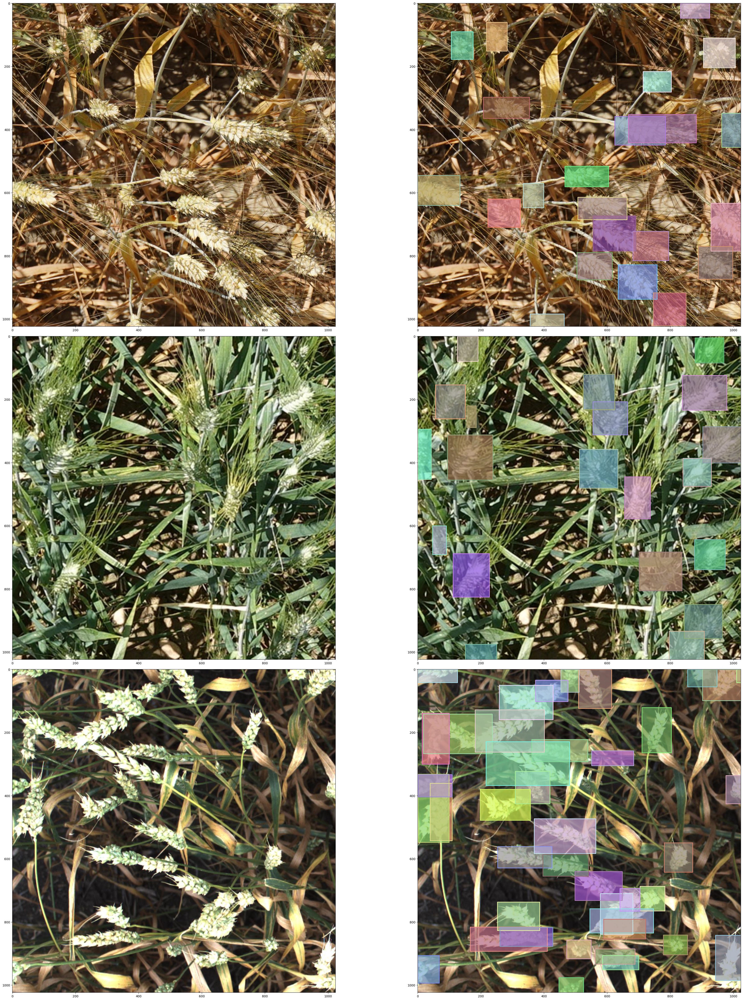

In [17]:
annFile = Path('./annotations_valid.json')
coco = COCO(annFile)
imgIds = coco.getImgIds()

imgs = coco.loadImgs(imgIds[-3:])
_,axs = plt.subplots(len(imgs),2,figsize=(40,15 * len(imgs)))
for img, ax in zip(imgs, axs):
    I = Image.open(dataDir/img['file_name'])
    annIds = coco.getAnnIds(imgIds=[img['id']])
    anns = coco.loadAnns(annIds)
    ax[0].imshow(I)
    ax[1].imshow(I)
    plt.sca(ax[1])
    coco.showAnns(anns, draw_bbox=True)
plt.tight_layout()
plt.show()

In [18]:
shutil.make_archive('valid2020', 'zip', 'valid2020')
shutil.make_archive('train2020', 'zip', 'train2020')

'/kaggle/working/train2020.zip'